In [1]:
!pip install prince

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.0/179.0 kB 10.8 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ast
import re
from collections import Counter
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import  RandomizedSearchCV
import lightgbm as lgb
import prince
import ipywidgets
from sklearn.ensemble import RandomForestRegressor

In [3]:
listing = pd.read_csv('/content/listings.csv')

In [4]:
#Change to Days Since Last/First review
listing['first_review'] = (pd.to_datetime('2025-09-01') - pd.to_datetime(listing['first_review'])).dt.days
listing['last_review'] = (pd.to_datetime('2025-11-28') - pd.to_datetime(listing['last_review'])).dt.days
listing['host_since'] = (pd.to_datetime('2025-11-28') - pd.to_datetime(listing['host_since'])).dt.days

#Lat/Long to number
listing['latitude'] = listing['latitude'] - min(listing['latitude'])
listing['longitude'] = listing['longitude'] - min(listing['longitude'])

#Price to Float, removal of all Nan samples
listing['price'] = listing['price'].replace(r'[\$,]', '', regex=True).astype(float)
listing = listing[listing['price'].notna()].reset_index()
listing = listing[listing['price'] < 1000].reset_index()

#Host Response/Acceptance rate to flaot
listing['host_response_rate'] = listing['host_response_rate'].astype(str).str.replace('%', '', regex=False).astype(float) / 100
listing['host_response_rate'] = pd.to_numeric(listing['host_response_rate'], errors='coerce')
listing['host_acceptance_rate'] = listing['host_acceptance_rate'].astype(str).str.replace('%', '', regex=False).astype(float) / 100
listing['host_acceptance_rate'] = pd.to_numeric(listing['host_acceptance_rate'], errors='coerce')

In [5]:
#Feature Types
host_catagorical = ["host_is_superhost",
                    "host_has_profile_pic",
                    "host_identity_verified",
                    "host_location",
                    "host_response_time",
                    "host_neighbourhood"]

host_continuous = ["host_since",
                   "host_acceptance_rate",
                   "host_response_rate"]

catagorical = ["neighbourhood_cleansed",
               "property_type",
               "room_type",
               "license",
               "instant_bookable",
               "accommodates",
               "bathrooms",
               "bedrooms",
               "beds"]

continuous = ["first_review",
              "last_review",
              "availability_30",
              "availability_60",
              "availability_90",
              "availability_365",
              "number_of_reviews",
              "number_of_reviews_ltm",
              "estimated_occupancy_l365d",
              "review_scores_rating",
              "review_scores_accuracy",
              "review_scores_cleanliness",
              "review_scores_checkin",
              "review_scores_communication",
              "review_scores_location",
              "review_scores_value",
              "reviews_per_month",
              "latitude",
              "longitude"]

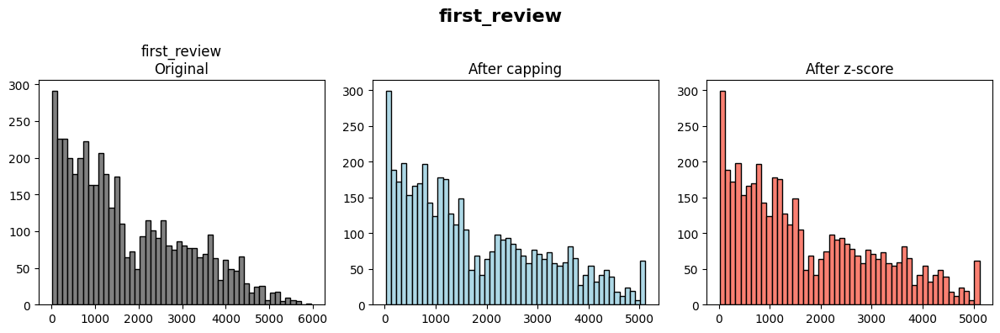

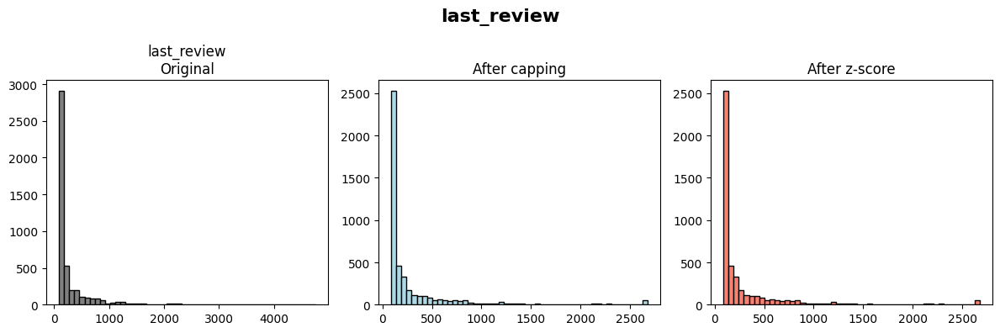

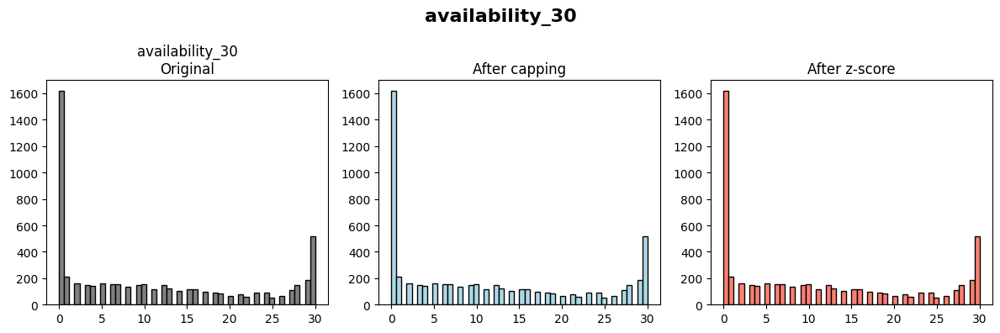

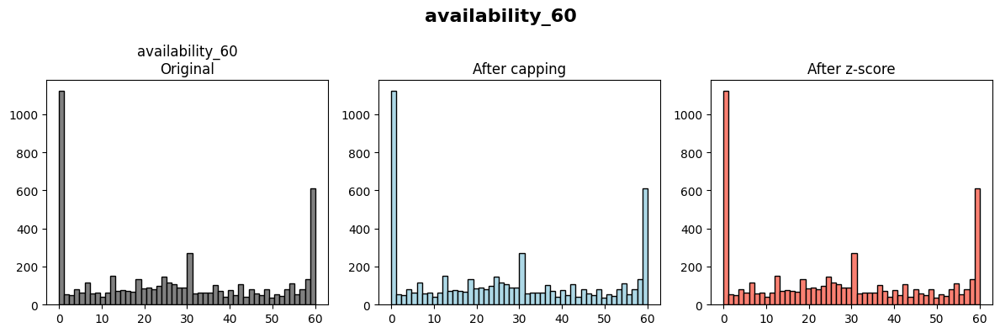

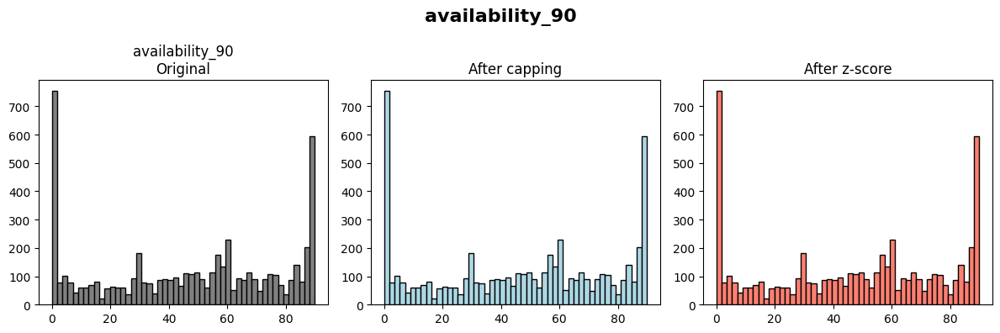

...

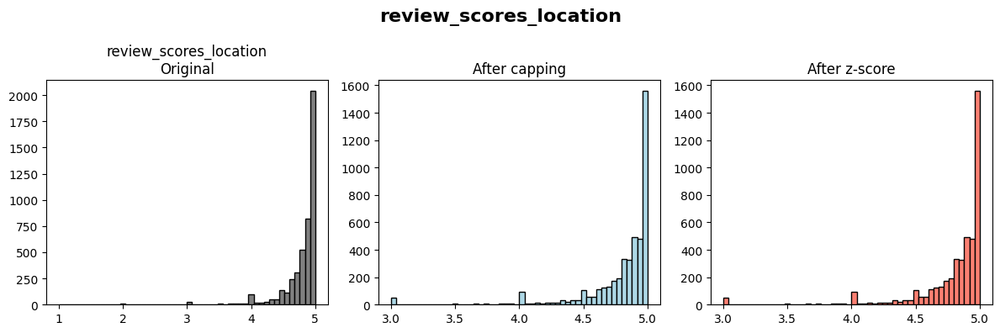

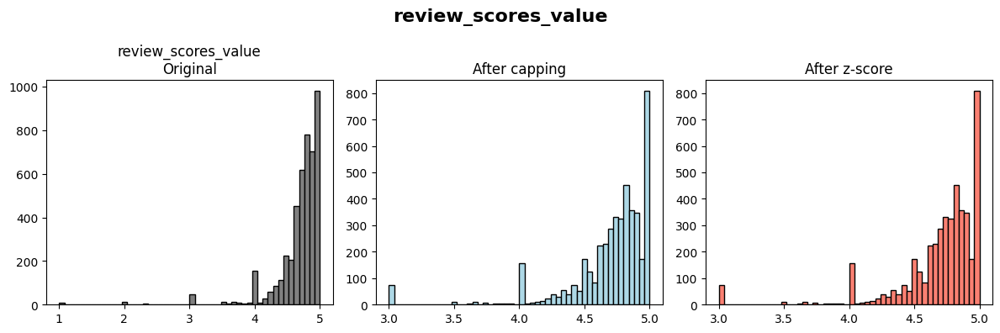

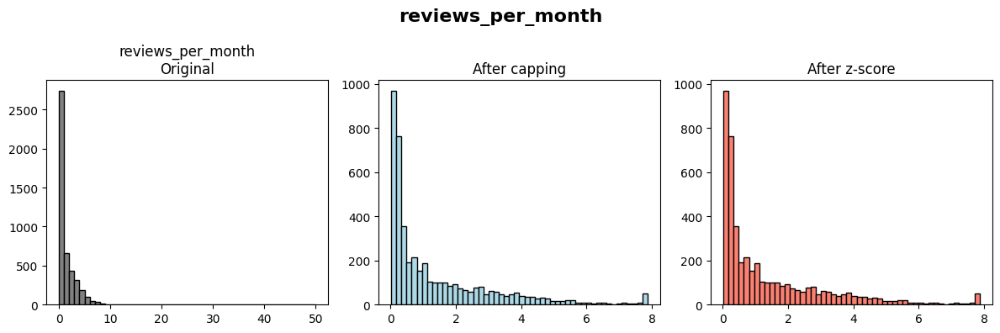

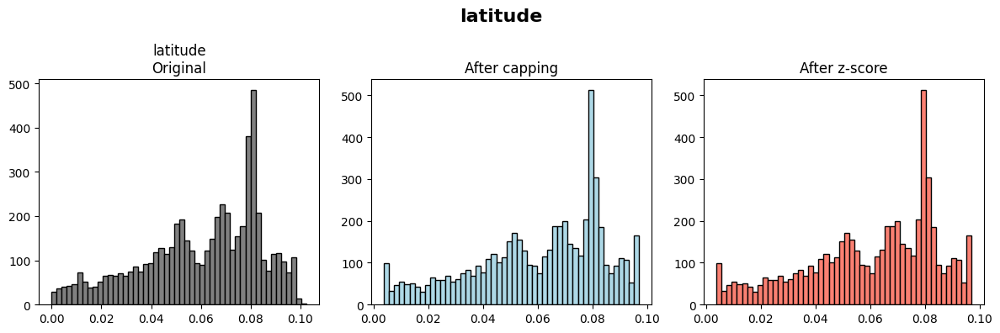

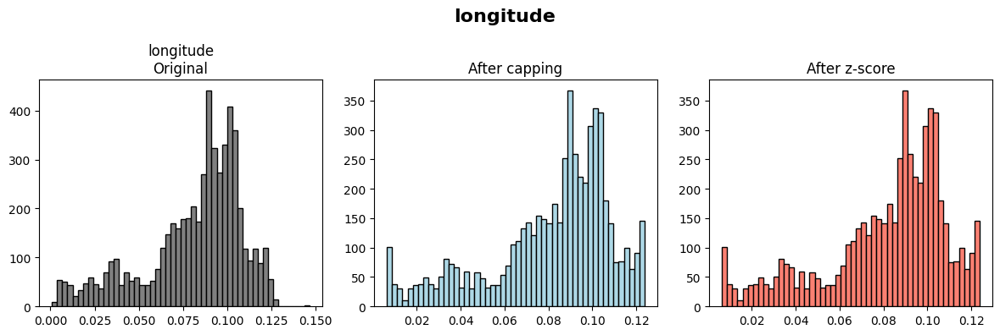

In [6]:
#cap outliers
def cap_outliers_percentile(col, lower, upper):
    lower_P = np.percentile(col.dropna(), lower)
    upper_P = np.percentile(col.dropna(), upper)

    col_capped = col.clip(lower_P, upper_P)

    return col_capped

#Get rid of rare catagories
def rare_to_other(col, min_count=35):
    freq = col.value_counts()
    keep_values = freq[freq >= min_count].index

    col_other = col.where(col.isin(keep_values), 'Other')

    return col_other

# Continuous Data Cleaning
for col in continuous:
    listing[col] = pd.to_numeric(listing[col], errors='coerce')
    plt.figure(figsize=(12, 4))

    # 1. Original
    plt.subplot(1, 3, 1)
    plt.hist(listing[col].dropna(), bins=50, color='gray', edgecolor='black')
    plt.title(f"{col}\nOriginal")

    # 2. After capping
    listing[col] = cap_outliers_percentile(listing[col], 1, 99)
    plt.subplot(1, 3, 2)
    plt.hist(listing[col].dropna(), bins=50, color='lightblue', edgecolor='black')
    plt.title("After capping")

    # 4. After z-score
    #listing[col] = zscore(pd.to_numeric(listing[col], errors='coerce'), nan_policy='omit')
    plt.subplot(1, 3, 3)
    plt.hist(listing[col].dropna(), bins=50, color='salmon', edgecolor='black')
    plt.title("After z-score")

    plt.suptitle(col, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Catagorical Data Cleaning
for col in catagorical:
    listing[col] = rare_to_other(listing[col], 50)
    listing[col] = pd.Categorical(listing[col]).codes.tolist()

In [9]:
print(listing[col])

0       2
1       2
2       1
3       1
4       1
       ..
5645    5
5646    2
5647    1
5648    1
5649    3
Name: beds, Length: 5650, dtype: int64


In [11]:
#impute the median value for nans
def number_impute(col):
    return col.fillna(col.median())

#replace nans with "Other"
def cat_missing(col):
    return col.fillna("Other")

for col in host_continuous:
    listing[col] = cap_outliers_percentile(listing[col], 1, 99)
    listing[col] = number_impute(listing[col])

for col in host_catagorical:
    listing[col] = rare_to_other(listing[col], 100)
    listing[col] = cat_missing(listing[col])

#FAMD PCA
famd = prince.FAMD(
    n_components=7,
    n_iter=10,
    copy=True,
    check_input=True,
    random_state=42,
    engine='sklearn'
)

#Fit FAMD
famd = famd.fit(listing[host_catagorical + host_continuous])

#Transform and update within listing
listing[[f'famd_{i}' for i in range(7)]] = famd.transform(listing[host_catagorical + host_continuous])

#Contributions along 7 components
famd_contributions = famd.column_contributions_.round(4) * 100

#Add to continuous features
continuous = continuous + [f'famd_{i}' for i in range(7)]

In [12]:
price=["price"]
eda=listing[catagorical+continuous+price]
corr = eda.corr()

# Focus on how each feature relates specifically to price_num.
# Sorting helps us see which features are most strongly related.
corr_with_price = corr["price"].sort_values(ascending=False)

print(corr_with_price[(corr_with_price>0.3)| (corr_with_price<-0.3)].drop("price"))

accommodates    0.546115
bedrooms        0.481252
beds            0.420997
room_type      -0.372850
Name: price, dtype: float64


In [26]:
#Test Train Split
X = listing[catagorical + continuous]
y = np.log1p(listing["price"])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)


In [27]:
#XGBOOST training
model = xgb.XGBRegressor(
    objective='reg:squarederror',
    eval_metric='rmse',
    tree_method='hist',
    enable_categorical=True,
    random_state=42,
    n_jobs=-1,
    verbosity=0
)

param_grid = {
    'n_estimators':     [200, 400, 800, 1600],
    'max_depth':        [4, 6, 8, 10],
    'learning_rate':    [0.03, 0.05, 0.1],
    'subsample':        [0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'min_child_weight': [1, 3, 5],
    'reg_alpha' :       [0, 0.1, 0.5, 1.0],
    'reg_lambda':       [0.5, 1.0, 2.0],
}

random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=5,                    # Using 5 currently for speed of calculation, can increase to 100 for final project
    scoring='neg_root_mean_squared_error',
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    return_train_score=False
)

random_search.fit(
    X_train, y_train,
    verbose=False,
)

best_model_XGBOOST = random_search.best_estimator_

best_model_XGBOOST.fit(
    X_train, y_train,
    verbose=2,
)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, device=None, early_stopping_rounds=None,
             enable_categorical=True, eval_metric='rmse', feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.03, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
             max_leaves=None, min_child_weight=5, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=1600,
             n_jobs=-1, num_parallel_tree=None, ...)

In [29]:
# Train Random Forest
model = RandomForestRegressor(
    random_state=42,
    n_jobs=-1,
    bootstrap=True,
    oob_score=False,
    warm_start=False
)

param_grid = {
    'n_estimators': [200, 400, 800, 1600],
    'max_depth': [4, 6, 8, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [0.6 ,0.7, 0.8, 0.9],
    'max_leaf_nodes': [None, 100, 500],
    'min_impurity_decrease': [0.0, 0.01, 0.1],
}

random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=50,
    scoring='neg_root_mean_squared_error',
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    return_train_score=False
)

random_search.fit(X_train, y_train)

best_model_RF = random_search.best_estimator_

best_model_RF.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


RandomForestRegressor(max_features=0.6, min_samples_split=5, n_estimators=1600,
                      n_jobs=-1, random_state=42)

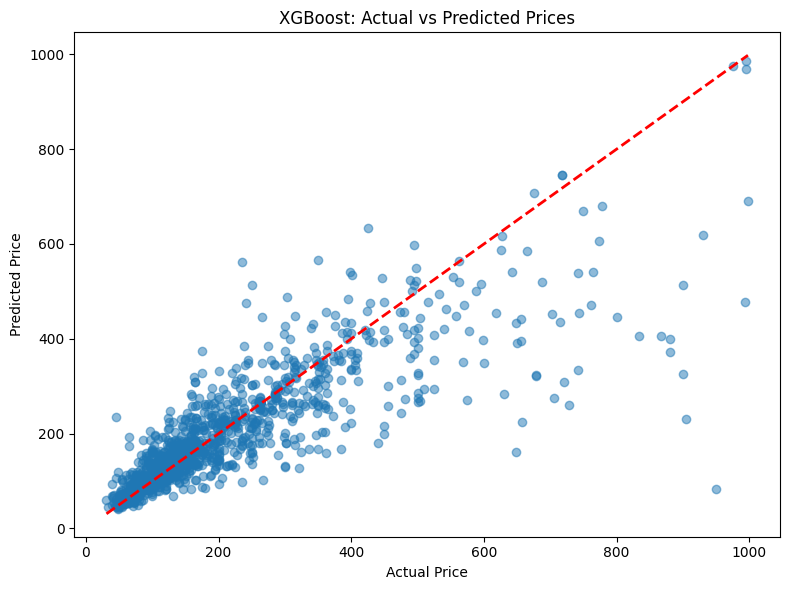

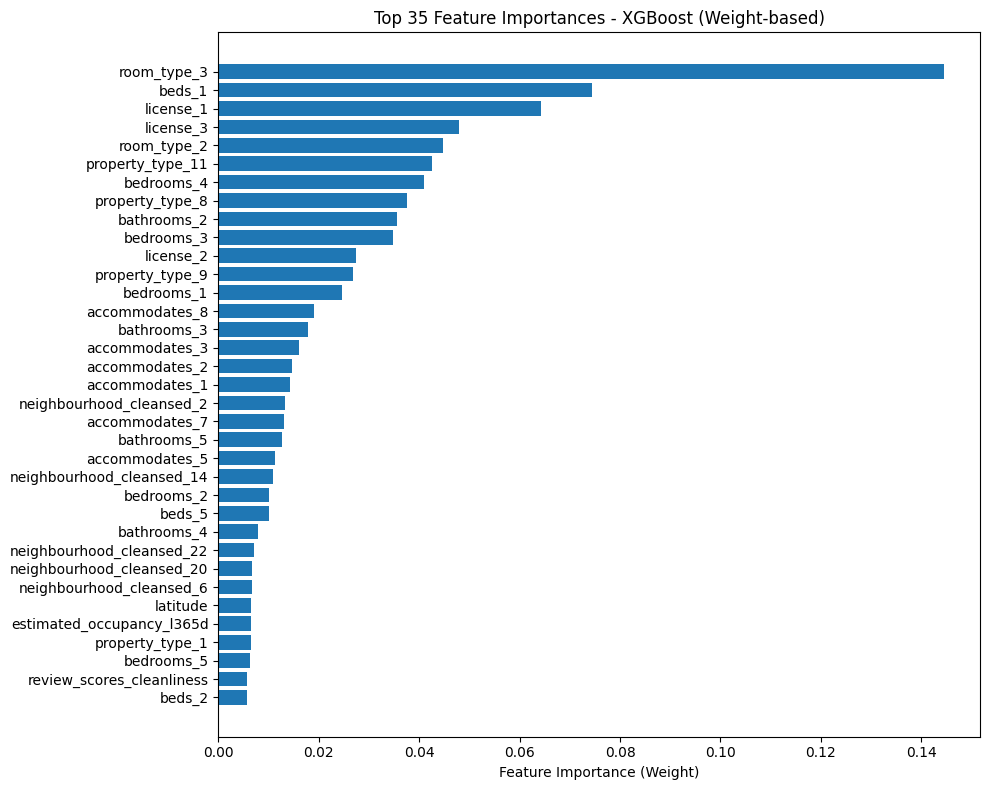

XGBoost RMSE:     8456.990040134218
XGBoost MAE:      50.17227026002597
XGBoost R²:       0.6870707474531579
XGBoost MAPE:     22.982747496010663 %


In [28]:
#XGBOOST
# Predictions
y_pred_XGB = np.expm1(best_model_XGBOOST.predict(X_test))
y_test_OG = np.expm1(y_test)

# Metrics
rmse = mean_squared_error(y_test_OG, y_pred_XGB)
mae = mean_absolute_error(y_test_OG, y_pred_XGB)
r2 = r2_score(y_test_OG, y_pred_XGB)
mape = 100 * np.mean(np.abs((y_test_OG - y_pred_XGB) / y_test_OG))

# Scatter Plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test_OG, y_pred_XGB, alpha=0.5)
plt.plot([y_test_OG.min(), y_test_OG.max()], [y_test_OG.min(), y_test_OG.max()], 'r--', lw=2)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("XGBoost: Actual vs Predicted Prices")
plt.tight_layout()
plt.show()

# Feature Importance Plot
importances = best_model_XGBOOST.feature_importances_
indices = np.argsort(importances)[::-1][:35]

plt.figure(figsize=(10, 8))
plt.title("Top 35 Feature Importances - XGBoost (Weight-based)")
plt.barh(range(len(indices)), importances[indices], align="center")
feature_names = X_train.columns if hasattr(X_train, "columns") else [f"feature_{i}" for i in range(X_train.shape[1])]
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.gca().invert_yaxis()  # Most important at the top
plt.xlabel("Feature Importance (Weight)")
plt.tight_layout()
plt.show()

# Print metrics
print("XGBoost RMSE:    ", rmse)
print("XGBoost MAE:     ", mae)
print("XGBoost R²:      ", r2)
print("XGBoost MAPE:    ", mape, "%")

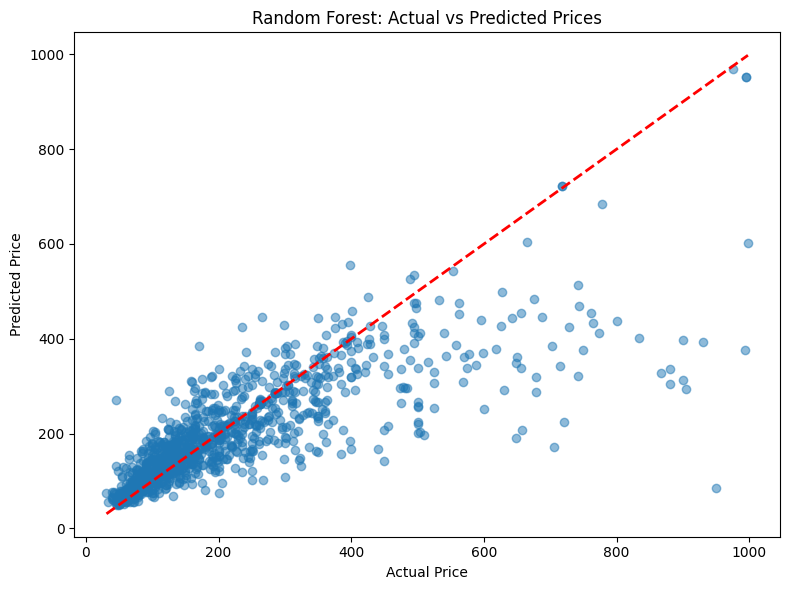

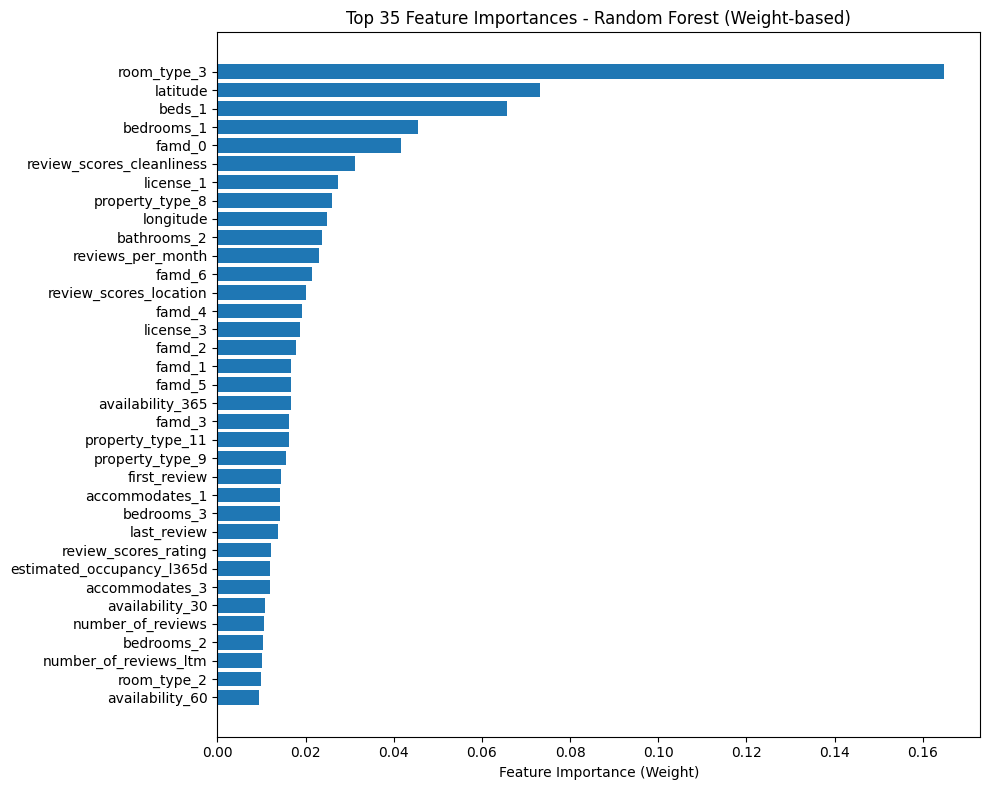

Random Forest RMSE:  10346.724034209234
Random Forest MAE:  55.4463847937121
Random Forest R²:  0.6171459818483886
Random Forest MAPE:  25.179356202974603 %


In [30]:
#RANDOM FOREST
# Predictions
y_pred_RF = np.expm1(best_model_RF.predict(X_test))
y_test_OG = np.expm1(y_test)
# Metrics
rmse = mean_squared_error(y_test_OG, y_pred_RF)
mae = mean_absolute_error(y_test_OG, y_pred_RF)
r2 = r2_score(y_test_OG, y_pred_RF)
mape = 100 * np.mean(np.abs((y_test_OG - y_pred_RF) / y_test_OG))
# Scatter Plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test_OG, y_pred_RF, alpha=0.5)
plt.plot([y_test_OG.min(), y_test_OG.max()], [y_test_OG.min(), y_test_OG.max()], 'r--', lw=2)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Random Forest: Actual vs Predicted Prices")
plt.tight_layout()
plt.show()
# Feature Importance Plot
importances = best_model_RF.feature_importances_
indices = np.argsort(importances)[::-1][:35]
plt.figure(figsize=(10, 8))
plt.title("Top 35 Feature Importances - Random Forest (Weight-based)")
plt.barh(range(len(indices)), importances[indices], align="center")
feature_names = X_train.columns if hasattr(X_train, "columns") else [f"feature_{i}" for i in range(X_train.shape[1])]
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.gca().invert_yaxis() # Most important at the top
plt.xlabel("Feature Importance (Weight)")
plt.tight_layout()
plt.show()
# Print metrics
print("Random Forest RMSE: ", rmse)
print("Random Forest MAE: ", mae)
print("Random Forest R²: ", r2)
print("Random Forest MAPE: ", mape, "%")

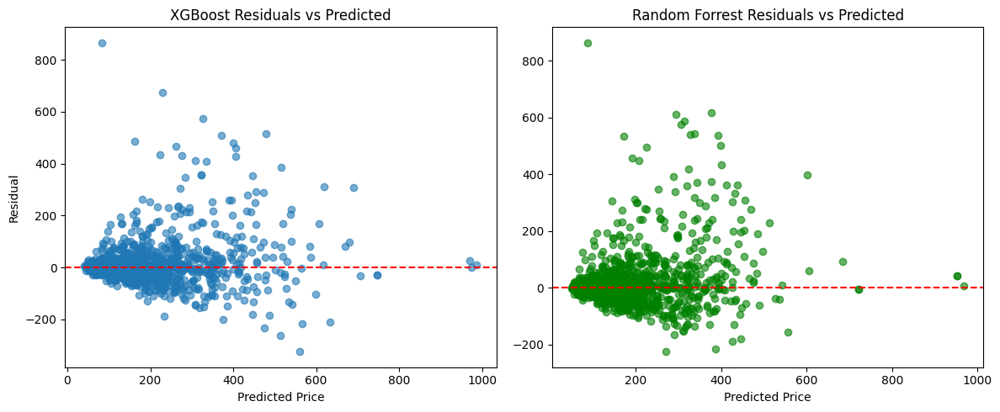

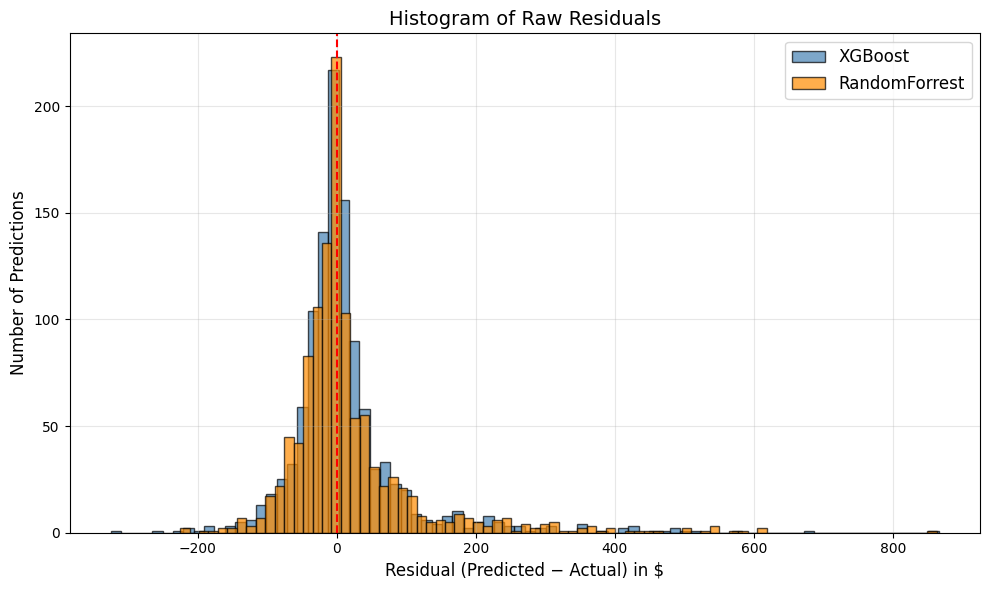

In [31]:
# Residuals vs Predicted to detect systematic bias
residuals_xgb = y_test_OG - y_pred_XGB
residuals_RF = y_test_OG - y_pred_RF

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.scatter(y_pred_XGB, residuals_xgb, alpha=0.6, label='XGBoost')
plt.axhline(0, color='red', linestyle='--')
plt.title('XGBoost Residuals vs Predicted')
plt.xlabel('Predicted Price'); plt.ylabel('Residual')

plt.subplot(1,2,2)
plt.scatter(y_pred_RF, residuals_RF, alpha=0.6, color='green', label='LightGBM')
plt.axhline(0, color='red', linestyle='--')
plt.title('Random Forrest Residuals vs Predicted')
plt.xlabel('Predicted Price')
plt.tight_layout(); plt.show()

# Residual Distribution
plt.figure(figsize=(10, 6))

plt.hist(residuals_xgb, bins=80, alpha=0.7, label='XGBoost', color='steelblue', edgecolor='black')
plt.hist(residuals_RF, bins=80, alpha=0.7, label='RandomForrest',  color='darkorange', edgecolor='black')

plt.axvline(0, color='red', linestyle='--', linewidth=1.5)
plt.xlabel('Residual (Predicted − Actual) in $', fontsize=12)
plt.ylabel('Number of Predictions', fontsize=12)
plt.title('Histogram of Raw Residuals', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
!pip install superTree

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 321.5/321.5 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 33.2 MB/s eta 0:00:00
  Created wheel for superTree: filename=supertree-0.5.5-py3-none-any.whl size=223914 sha256=3744451a97a13ab728c1ca3f6d9eb412d8310806406f0efef38a1fec8ab3896d
  Stored in directory: /root/.cache/pip/wheels/94/d5/5f/2e4b444abd02194d56fa70a3ad54a41c856f5a680a23882100
Successfully built superTree


In [ ]:
from supertree import SuperTree

st = SuperTree(
    best_model_XGBOOST,
    X_train,
    y_train)
# Visualize the tree
st.show_tree()

In [ ]:
st = SuperTree(
    best_model_RF,
    X_train,
    y_train)
# Visualize the tree
st.show_tree()

In [ ]:
!pip install shap

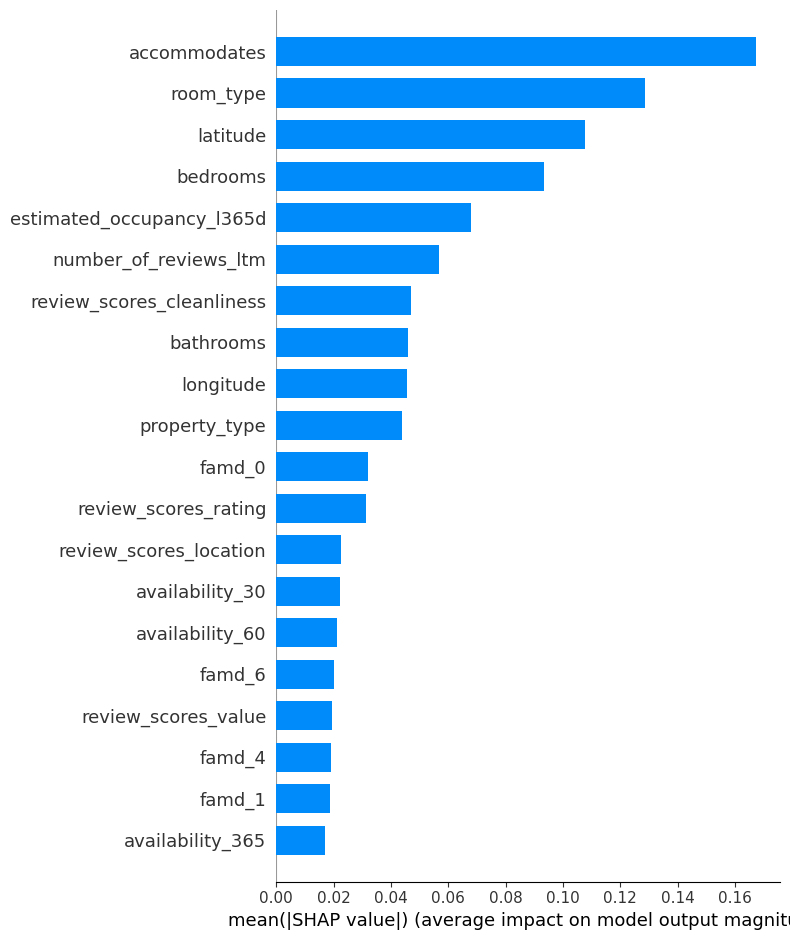

In [ ]:
import shap
# Initialize a SHAP explainer with the trained model
explainer = shap.TreeExplainer(best_model_XGBOOST)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Visualize global feature importances
shap.summary_plot(shap_values, X_test, plot_type="bar")

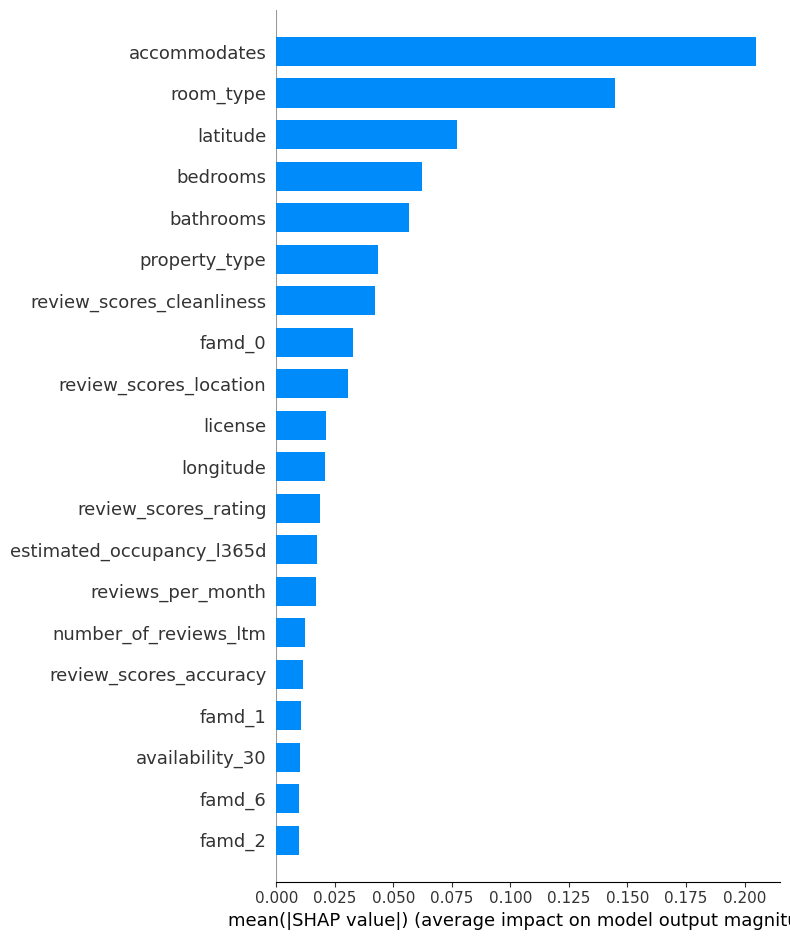

In [ ]:
# Initialize a SHAP explainer with the trained model
explainer = shap.TreeExplainer(best_model_RF)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Visualize global feature importances
shap.summary_plot(shap_values, X_test, plot_type="bar")